# Week 8 - Semantic Networks

This week, we explore the representation and analysis of semantic networks. A word or document network is an unsupervized representation of text akin to a clustering or an embedding, but semantic networks can also be defined using semantic or syntactic information derived from methods we have used earlier in the quarter. For example, we can define links between words as a function of their co-presence within a document, chapter, paragraph, sentence, noun phrase or continuous bag of words. We can also define links as a function of words that rely on one another within a directed dependency parse, or links between extracted Subjects, Verbs and Objects, or nouns and the adjectives that modify them (or verbs and the adverbs that modify *them*). Rendering words linked as a network or discrete topology allows us to take advantage of the wide range of metrics and models developed for network analysis. These include measurement of network centrality, density and modularity, "block modeling" structurally equivalent relationships, andsophisticated graphical renderings of networks or network partitions that allow us to visually interrogate their structure and complexity.

For this notebook we will use the following packages:

In [1]:
#All these packages need to be installed from pip

import nltk #For POS tagging
import sklearn #For generating some matrices
import pandas as pd #For DataFrames
import numpy as np #For arrays
import matplotlib.pyplot as plt #For plotting
import seaborn #MAkes the plots look nice
import IPython.display #For displaying images
from IPython.display import Image

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning
%matplotlib inline

#This has some C components and installs are OS specific
#See http://igraph.org/python/ for details
import igraph as ig #For the networks


import pickle #if you want to save layouts

# Note about `igraph`

Getting `igraph` to make plots in jupyter can be tricky, if you are having issues try these steps:

+ install `cairocffi`, remove `pycairo` if present
+ install `igraph` version [`0.7.1`](https://github.com/igraph/python-igraph/tree/release-0.7) from the github repo, **Do not** use the pip version, there is a [known issue](https://github.com/igraph/python-igraph/issues/89) with it

If the resulting plots have garbled labels, save them as svg files `target = 'filename.svg'` and the labels will be fine.


We will primarily be dealing with graphs in this notebook, so lets first go over how to use them.

To start with lets create an undirected graph:

## <span style="color:red">*Your Turn*</span>

<span style="color:red">Construct cells immediately below this that render some reasonable networks to meaningfully characterize the structure of words and documents (or subdocuments like chapters or paragraphs) from your corpus. Also create some smaller, word neighborhood graphs. What are useful filters and thresholds and what semantic structures do they reveal that given insight into the social world and social game inscribed in your corpus?

First, load my data, 30 articles from the Daily Mail corpus and The Guardian corpus, respectively. 

In [2]:
dailymailDF = pd.read_pickle('mydata/dailymail_sample.pkl')
guardianDF = pd.read_pickle('mydata/guardian_sample.pkl')

We will be extracting sentences, as well as tokenizing and stemming. (You should be able to do this in your sleep now):

In [3]:
def normlizeTokens(tokenLst, stopwordLst = None, stemmer = None, lemmer = None, vocab = None):
    #We can use a generator here as we just need to iterate over it

    #Lowering the case and removing non-words
    workingIter = (w.lower() for w in tokenLst if w.isalpha())

    #Now we can use the semmer, if provided
    if stemmer is not None:
        workingIter = (stemmer.stem(w) for w in workingIter)

    #And the lemmer
    if lemmer is not None:
        workingIter = (lemmer.lemmatize(w) for w in workingIter)

    #And remove the stopwords
    if stopwordLst is not None:
        workingIter = (w for w in workingIter if w not in stopwordLst)

    #We will return a list with the stopwords removed
    if vocab is not None:
        vocab_str = '|'.join(vocab)
        workingIter = (w for w in workingIter if re.match(vocab_str, w))

    return list(workingIter)

stop_words_nltk = nltk.corpus.stopwords.words('english')
snowball = nltk.stem.snowball.SnowballStemmer('english')
wordnet = nltk.stem.WordNetLemmatizer()

For now we will not be dropping any stop words:

In [4]:
guardianDF['tokenized_sents'] = guardianDF['text'].apply(lambda x: [nltk.word_tokenize(s) for s in nltk.sent_tokenize(x)])
guardianDF['normalized_sents'] = guardianDF['tokenized_sents'].apply(lambda x: [normlizeTokens(s, stopwordLst = None, stemmer = snowball) for s in x])

dailymailDF['tokenized_sents'] = dailymailDF['text'].apply(lambda x: [nltk.word_tokenize(s) for s in nltk.sent_tokenize(x)])
dailymailDF['normalized_sents'] = dailymailDF['tokenized_sents'].apply(lambda x: [normlizeTokens(s, stopwordLst = None, stemmer = snowball) for s in x])


Let's start by looking at words co-occurring in the same sentences:

In [5]:
def wordCooccurrence(sentences, makeMatrix = False):
    words = set()
    for sent in sentences:
        words |= set(sent)
    wordLst = list(words)
    wordIndices = {w: i for i, w in enumerate(wordLst)}
    wordCoCounts = {}
    #consider a sparse matrix if memory becomes an issue
    coOcMat = np.zeros((len(wordIndices), len(wordIndices)))
    for sent in sentences:
        for i, word1 in enumerate(sent):
            word1Index = wordIndices[word1]
            for word2 in sent[i + 1:]:
                coOcMat[word1Index][wordIndices[word2]] += 1
    if makeMatrix:
        return coOcMat, wordLst
    else:
        coOcMat = coOcMat.T + coOcMat
        edges = list(zip(*np.where(coOcMat)))
        weights = coOcMat[np.where(coOcMat)]
        g = ig.Graph( n = len(wordLst),
            edges = edges,
            vertex_attrs = {'name' : wordLst, 'label' : wordLst},
            edge_attrs = {'weight' : weights}
                    )
        return g

Build a graph based on word cooccurence in the 30 articles for each corpus.

In [6]:
dg = wordCooccurrence(dailymailDF['normalized_sents'].sum())
gg = wordCooccurrence(guardianDF['normalized_sents'].sum())

Total number of vertices:

In [7]:
print(dg.vcount(), gg.vcount())

2926 3949


Total number of edges:

In [8]:
print(dg.ecount(), gg.ecount())

229287 358128


A part of the adjacency matrix of cleaned word by press releases:

In [9]:
print(dg.get_adjacency()[:10, :10])
print(gg.get_adjacency()[:10, :10])

[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 1, 2, 0, 0, 0, 0, 0]
 [0, 0, 0, 2, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]]
[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]]


We can save the graph and read it later:

In [10]:
dg.write_gml('mydata/Dailymail_Words.gml')
gg.write_gml('mydata/Guardian_Words.gml')

Or, we can build graphs starting with a two-mode network. Let's again use the document-word frequency matrix that we used in week 3.

In [11]:
def tokenize(text):
    tokenlist = nltk.word_tokenize(text)
    normalized = normlizeTokens(tokenlist, stemmer = snowball)
    return normalized

In [12]:
Vectorizer = sklearn.feature_extraction.text.CountVectorizer(stop_words=stop_words_nltk, tokenizer = tokenize)
dVects = Vectorizer.fit_transform(dailymailDF['text'])
gVects = Vectorizer.fit_transform(guardianDF['text'])

In [13]:
print(dVects.shape, gVects.shape)

(30, 2825) (30, 3842)


We need to turn the matrix into a list as our input.

In [14]:
dINP = dVects.todense().tolist()
gINP = gVects.todense().tolist()

In [15]:
dg = ig.Graph.Incidence(dINP, multiple=True)
gg = ig.Graph.Incidence(gINP, multiple=True)

We can check whether it is a bipartite network.

In [16]:
print(dg.is_bipartite(), gg.is_bipartite())

True True


Give colors and shapes to documents and words:

In [17]:
dg.vs['color']  = ['red']*dVects.shape[0] + ['blue']*dVects.shape[1]
dg.vs['shape']  = ['square']*dVects.shape[0] + ['circle']*dVects.shape[1]

gg.vs['color']  = ['yellow']*gVects.shape[0] + ['cyan']*gVects.shape[1]
gg.vs['shape']  = ['square']*gVects.shape[0] + ['circle']*gVects.shape[1]

A very popular layout algorithm for visualizing graphs is the Fruchterman-Reingold Algorithm, which uses a physical metaphor for lay-out. Nodes repel one another, and edges draw connected elements together like springs. The algorithm attempts to minimize the energy in such a system. For a large graph, however, the algorithm is computational demanding. The commented code gives you a layout and you can save it as a pickle. Let's then load a layout.

In [18]:
#These take a long time
#layout = g.layout_fruchterman_reingold()
#pickle.dump(layout, open( "layout.pkl", "wb" ) )
#layout = pickle.load(open('layout.pkl','rb'))

Then, let's plot the bipartite network:

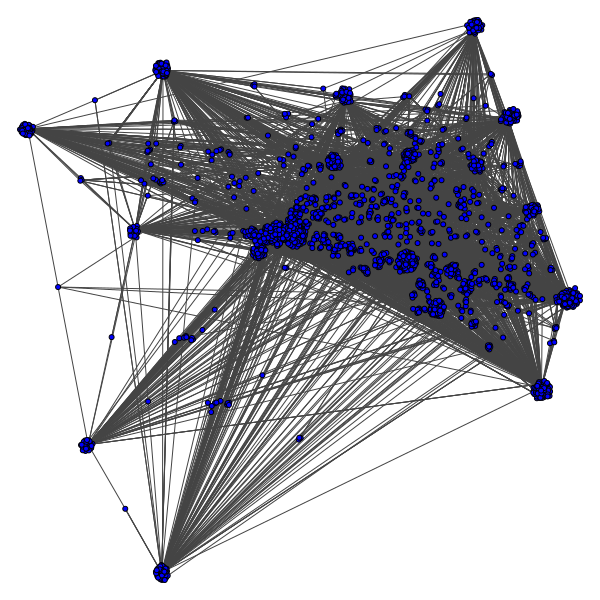

In [19]:
# dailymail
# plot = ig.plot(dg, 'myimage/dg_nolayout.png', layout = None, vertex_size = 5)
Image(filename='myimage/dg_nolayout.png')

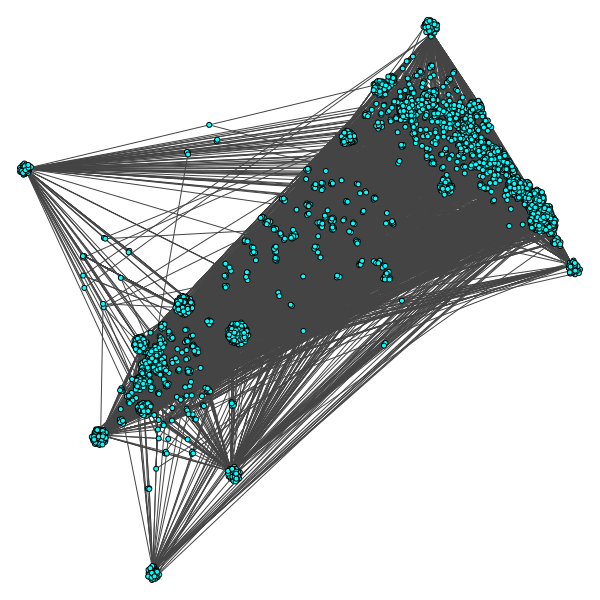

In [20]:
# plot = ig.plot(gg, 'myimage/gg_nolayout.png', layout = None, vertex_size = 5)
Image(filename='myimage/gg_nolayout.png')

A faster algorithm for large networks is the Large Graph Layout algorithm. If we want even faster computation and tunable visualizations, check out [Pajek](http://mrvar.fdv.uni-lj.si/pajek/) or [gephi](https://gephi.org/).

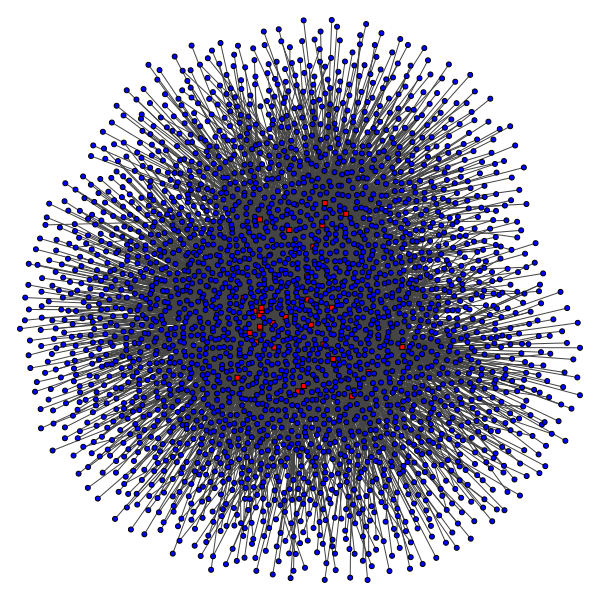

In [21]:
# dailymail
# dlayout = dg.layout_lgl()
# plot = ig.plot(dg, 'myimage/dg_lgl.png', layout = dlayout, vertex_size = 5)
Image(filename='myimage/dg_lgl.png')

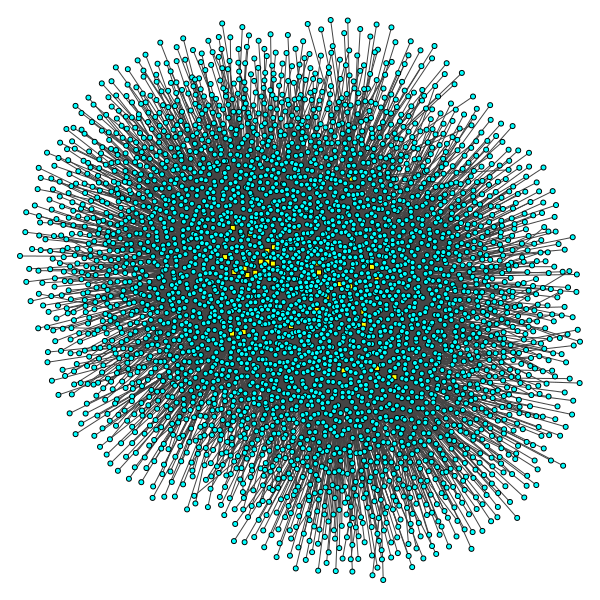

In [22]:
# guardian
# glayout = gg.layout_lgl()
# plot = ig.plot(gg, 'myimage/gg_lgl.png', layout = glayout, vertex_size = 5)
Image(filename='myimage/gg_lgl.png')

A two-mode network can be easily transformed into two one-mode network, enabling words to be connected to other words via the number of documents that share them, or documents to be connected to other documents via the words they share.

In [23]:
dgDoc, dgWord = dg.bipartite_projection()
ggDoc, ggWord = gg.bipartite_projection()

Let's first take a look at the document-to-document network:

In [24]:
print(dgDoc.summary())
print(ggDoc.summary())

IGRAPH U-WT 30 435 -- 
+ attr: color (v), shape (v), type (v), weight (e)
IGRAPH U-WT 30 435 -- 
+ attr: color (v), shape (v), type (v), weight (e)


Let's do a visualization. It is not surprising that almost every document is connected to every one else. We can use edge weight to distinguish distance (modeled as attraction) between the nodes.

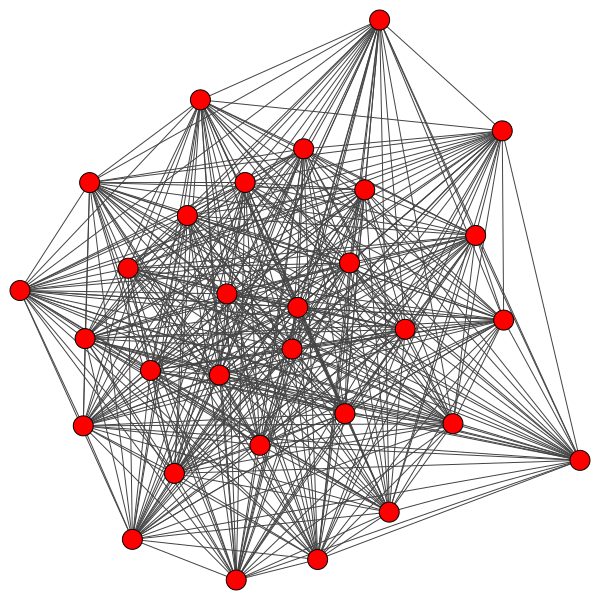

In [25]:
# dailymail
# dlayout = dgDoc.layout_fruchterman_reingold(weights = dgDoc.es['weight'])
# plot = ig.plot(dgDoc, 'myimage/dgDoc.png', layout = dlayout, vertex_shape = 'circle')
Image(filename='myimage/dgDoc.png')

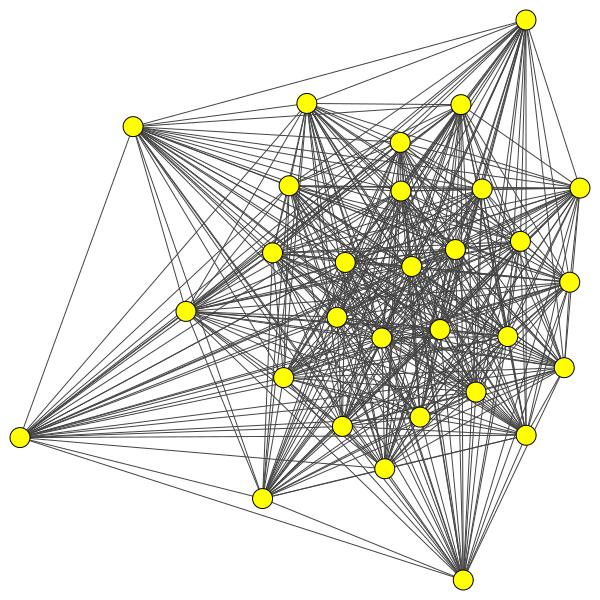

In [26]:
# guardian
# glayout = ggDoc.layout_fruchterman_reingold(weights = ggDoc.es['weight'])
# plot = ig.plot(ggDoc, 'myimage/ggDoc.png', layout = glayout, vertex_shape = 'circle')
Image(filename='myimage/ggDoc.png')

Another way to visualize the graph is to binarize the adjacency matrix with some cutoff values for edge weight. Let's use the medianw weight as our cutoff threshhold.

In [28]:
# dailymail
dmedian = np.median(dgDoc.es['weight'])
dmedEdges = dgDoc.es.select(lambda x: x['weight'] > dmedian)
dg1_d = dgDoc.subgraph_edges(dmedEdges)

# guardian
gmedian = np.median(ggDoc.es['weight'])
gmedEdges = ggDoc.es.select(lambda x: x['weight'] > gmedian)
gg1_d = ggDoc.subgraph_edges(gmedEdges)

In [29]:
print(dg1_d.summary())
print(gg1_d.summary())

IGRAPH U-WT 30 217 -- 
+ attr: color (v), shape (v), type (v), weight (e)
IGRAPH U-WT 29 217 -- 
+ attr: color (v), shape (v), type (v), weight (e)


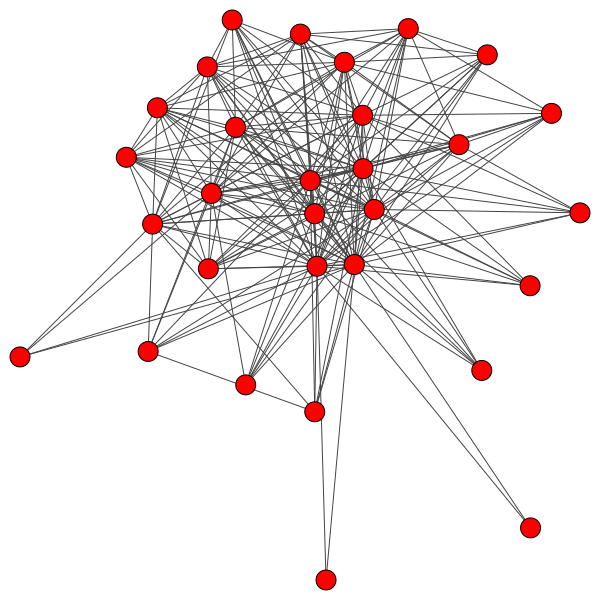

In [30]:
# dailymail
# dlayout = dg1_d.layout_fruchterman_reingold()
# plot = ig.plot(dg1_d, 'myimage/dg1_d.png', layout = dlayout, vertex_shape = 'circle')
Image(filename='myimage/dg1_d.png')

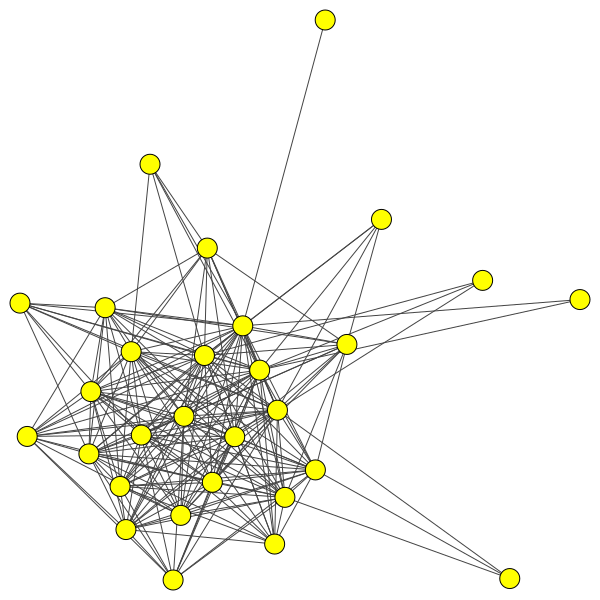

In [31]:
# guardian
# glayout = gg1_d.layout_fruchterman_reingold()
# plot = ig.plot(gg1_d, 'myimage/gg1_d.png', layout = glayout, vertex_shape = 'circle')
Image(filename='myimage/gg1_d.png')

Now let's turn it around and look at the word-to-word network (via documents). Instead of working directly with `gWord`, let's start with matrix multiplication which gives us more freedom to define edge weight. First, let's reduce the number of words to a manageable size.

In [32]:
Vectorizer = sklearn.feature_extraction.text.CountVectorizer(stop_words=stop_words_nltk, tokenizer = tokenize, max_features = 200)
# dailymail
dVects = Vectorizer.fit_transform(dailymailDF['text'])
dwordsLst = Vectorizer.get_feature_names()
print(dVects.shape)

# guardian
gVects = Vectorizer.fit_transform(guardianDF['text'])
gwordsLst = Vectorizer.get_feature_names()
print(gVects.shape)

(30, 200)
(30, 200)


Let's define the weight of an edge to the be the number of document coocurrences of two words divided by the square root of the product of their marginal frequencies.

In [33]:
# dailymail
dA = dVects.todense() #Get the doc-word frequency matrix.
dM = np.sum(dA, axis = 0) #The marginal frequencies are simplies the column sums.
dW = dA.T.dot(dA)/np.sqrt(dM.T.dot(dM)) #Get out weight matrix.
np.fill_diagonal(dW,0) #Set the diagonal to zero.

# guardian
gA = gVects.todense() #Get the doc-word frequency matrix.
gM = np.sum(gA, axis = 0) #The marginal frequencies are simplies the column sums.
gW = gA.T.dot(gA)/np.sqrt(gM.T.dot(gM)) #Get out weight matrix.
np.fill_diagonal(gW,0) #Set the diagonal to zero.

In [34]:
# dailymail
dG = ig.Graph.Weighted_Adjacency(dW.tolist(), mode=ig.ADJ_UNDIRECTED)
dG.vs['name'] = dwordsLst #Names are what you reference
dG.vs['label'] = dwordsLst #Label are what is displayed

# guardian
gG = ig.Graph.Weighted_Adjacency(gW.tolist(), mode=ig.ADJ_UNDIRECTED)
gG.vs['name'] = gwordsLst #Names are what you reference
gG.vs['label'] = gwordsLst #Label are what is displayed

Now, let's visualize this:

In [35]:
dlayout = dG.layout_fruchterman_reingold()
glayout = gG.layout_fruchterman_reingold()

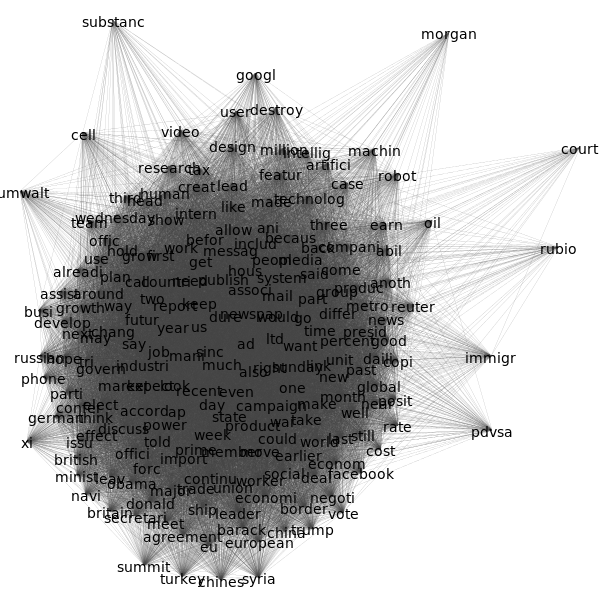

In [36]:
# plot = ig.plot(dG, 'myimage/dG.png', layout = dlayout, vertex_size = 0, edge_width = 0.1)
Image(filename='myimage/dG.png')

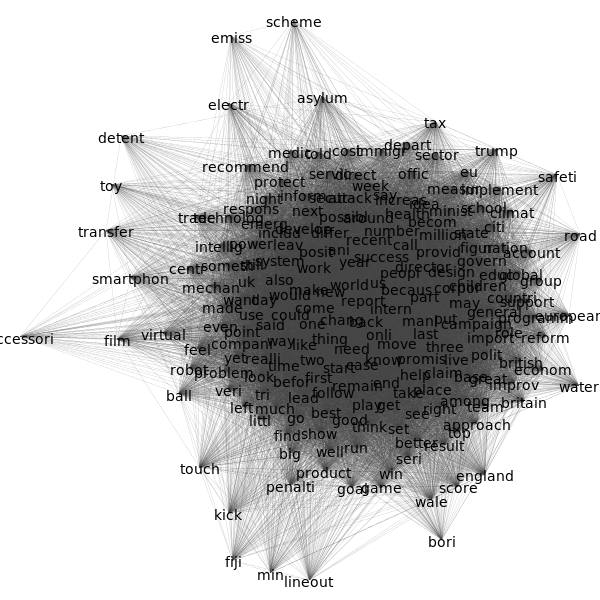

In [37]:
# plot = ig.plot(gG, 'myimage/gG.png', layout = glayout, vertex_size = 0, edge_width = 0.1)
Image(filename='myimage/gG.png')

Even better, we can input the weight matrix with some cutoff value. We use 4 for now as it is useful for demonstration, but you can explore:

In [38]:
cutoff = 5
dG_b = dG.subgraph_edges(dG.es.select(lambda x: x['weight'] > cutoff))
gG_b = gG.subgraph_edges(gG.es.select(lambda x: x['weight'] > cutoff))

In [39]:
dG_b = dG.subgraph_edges(dG.es.select(weight_gt = cutoff))
gG_b = gG.subgraph_edges(gG.es.select(weight_gt = cutoff))

In [40]:
dlayout = dG_b.layout_fruchterman_reingold()
glayout = gG_b.layout_fruchterman_reingold()

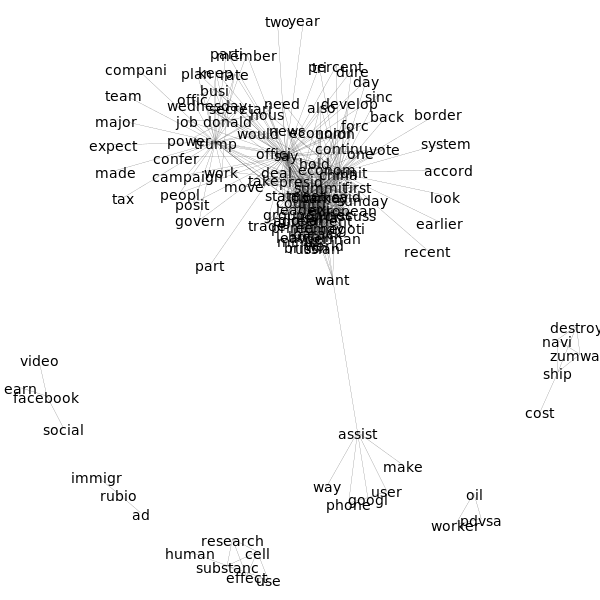

In [41]:
# plot = ig.plot(dG_b, 'myimage/dG_b.png', layout = dlayout, vertex_size = 0, edge_width = 0.2)
Image(filename='myimage/dG_b.png')

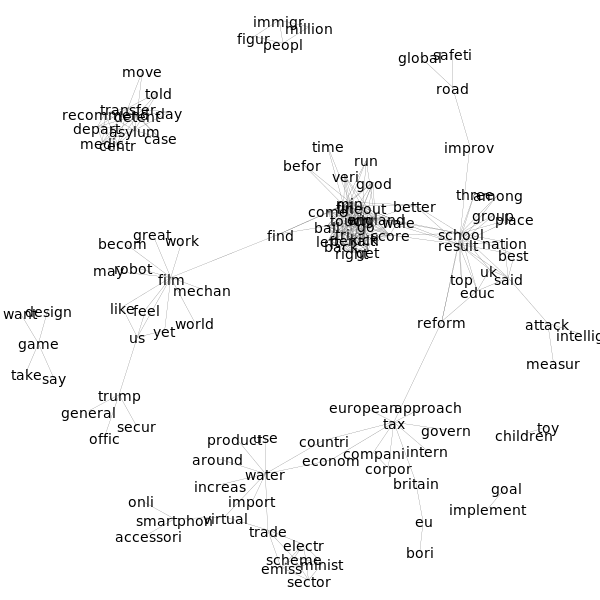

In [42]:
# plot = ig.plot(gG_b, 'myimage/gG_b.png', layout = glayout, vertex_size = 0, edge_width = 0.2)
Image(filename='myimage/gG_b.png')

## <span style="color:red">*My Memo*</span>

<span style="color:red"> My data includes two corpora; each consits of collected articles from either Daily Mail or The Guardian, with the same six search terms: automation, artificial intelligence, globalization, immigration, international trade, and robot. For this assingment, I use only 60 articles: 30 articles randomly selected from each corpus.

<span style="color:red"> The document networks for both corpora show that articles in each corpus are in general well connected to other articles in the same corpus. With the median weight, however, we see some articles that are less connected to others. However, no clear sign of clusters. The word networks for both corpora show that Daily Mail corpus has more centralized, i.e. has a single cluster that contains most of the words with few outliers. In contrast, the Guardian corpus has the word network consists of many loosely connected clusters. In each word network, I can find a word cluster with 'trump'. According to the plots, Daily Mail seems to be more interested in Trump more than The Guardian is.
</span>

## <span style="color:red">*Your Turn*</span>

<span style="color:red">Construct cells immediately below this that calculate different kinds of centrality for distinct words or documents in a network composed from your corpus of interest. Which type of words tend to be most and least central? Can you identify how different centrality measures distinguish different kind of words in your corpus? What do these patterns suggest about the semantic content and structure of your documents?

**Betweenness**

In [43]:
dG_b.vs[np.argmax(dG_b.betweenness())]
gG_b.vs[np.argmax(gG_b.betweenness())]

igraph.Vertex(<igraph.Graph object at 0x7feec887cc78>, 90, {'name': 'tax', 'label': 'tax'})

We can color and size the nodes by betweenness centrality:

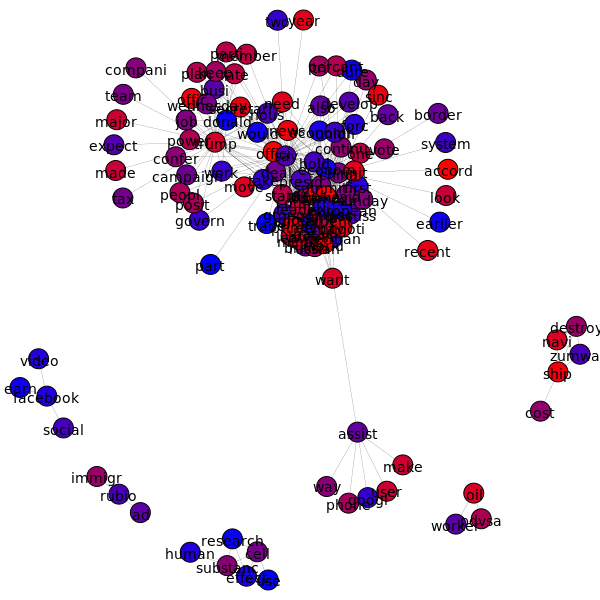

In [44]:
# dailymail
# dpal = ig.GradientPalette("red", "blue", dG_b.vcount())
# dG_b.vs['color'] = [dpal.get(int(v)) for v in np.argsort(dG_b.betweenness())]
# plot = ig.plot(dG_b, 'myimage/dG_between.png', layout = dlayout, edge_width = 0.2)
Image(filename = 'myimage/dG_between.png')

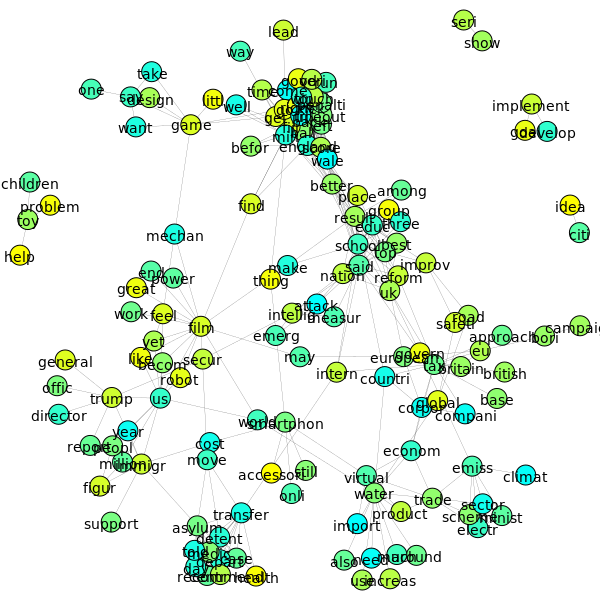

In [45]:
# guardian
# gpal = ig.GradientPalette("yellow", "cyan", gG_b.vcount())
# gG_b.vs['color'] = [gpal.get(int(v)) for v in np.argsort(gG_b.betweenness())]
# plot = ig.plot(gG_b, 'myimage/gG_between.png', layout = glayout, edge_width = 0.2)
Image(filename='myimage/gG_between.png')

The distrubution of betweenness centrality is:

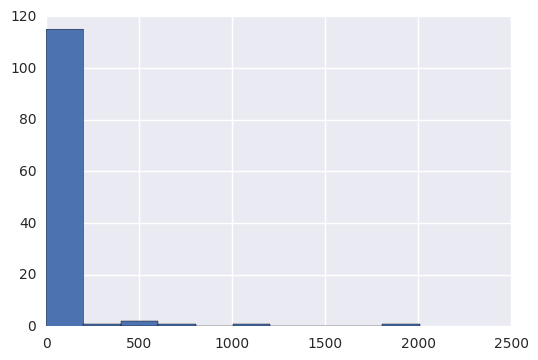

In [46]:
# dailymail
plt.hist(dG_b.betweenness())
plt.show()

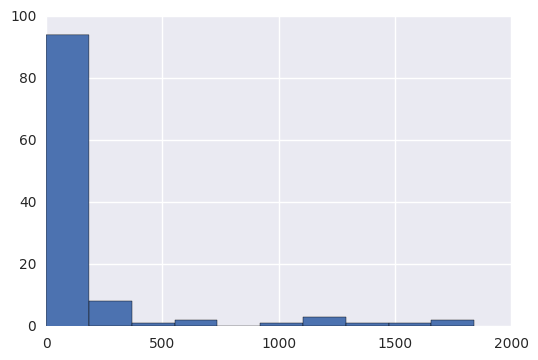

In [47]:
# guardian
plt.hist(gG_b.betweenness())
plt.show()

Or if we set a max of 500

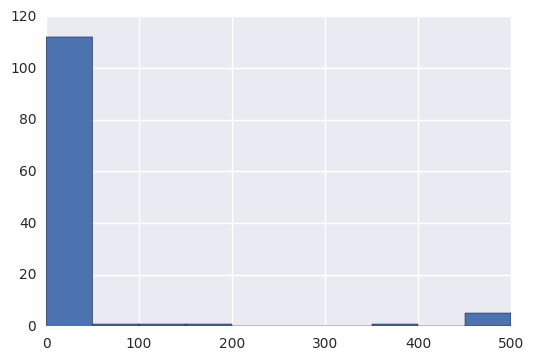

In [48]:
# dailymail
plt.hist([min(b, 500) for b in dG_b.betweenness()])
plt.show()

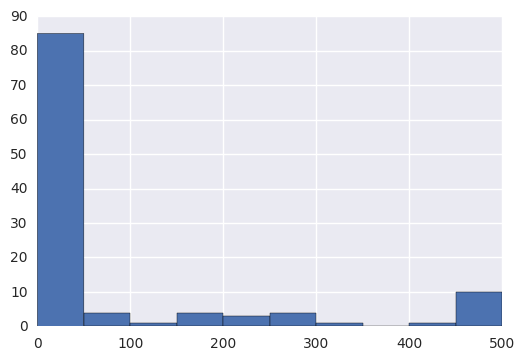

In [49]:
# guardian
plt.hist([min(b, 500) for b in gG_b.betweenness()])
plt.show()

Another way to visualize the graph involes the use of label sizes to represent betweenness centrality and edge widths to represent edge weight:

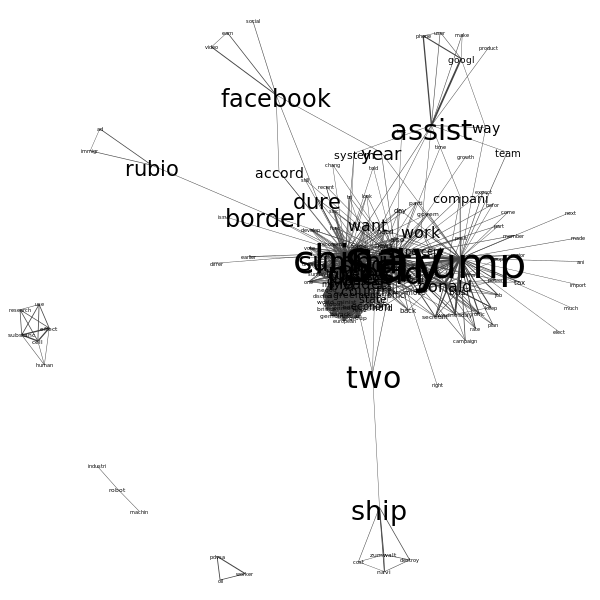

In [50]:
# dailymail
# dedge_width = (np.array(dG_b.es['weight'])*0.1).tolist()
# dsize = (5 + np.sqrt(np.array(dG_b.betweenness()))).tolist()
# plot = ig.plot(dG_b, 'myimage/dG_between_eweight.png', layout = dlayout, vertex_size = 0, vertex_label_size = dsize, edge_width = dedge_width)
Image(filename='myimage/dG_between_eweight.png')

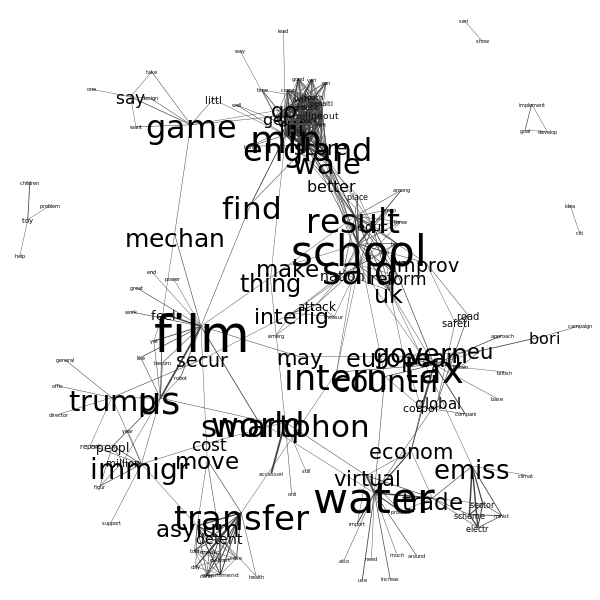

In [51]:
# guardian
# gedge_width = (np.array(gG_b.es['weight'])*0.1).tolist()
# gsize = (5 + np.sqrt(np.array(gG_b.betweenness()))).tolist()
# plot = ig.plot(gG_b, 'myimage/gG_between_eweight.png', layout = glayout, vertex_size = 0, vertex_label_size = gsize, edge_width = gedge_width)
Image(filename='myimage/gG_between_eweight.png')

What are the top ten words in terms of betweenness?

In [52]:
# dailymail
sorted(zip(dG_b.vs['name'], dG_b.betweenness()), key = lambda x: x[1], reverse = True)[:10]

[('say', 2009.0611769336613),
 ('china', 1007.6111769336612),
 ('trump', 753.7912698412699),
 ('want', 558.0),
 ('assist', 477.5),
 ('presid', 390.81117693366144),
 ('summit', 182.3278436003281),
 ('obama', 123.74451026699482),
 ('meet', 81.71117693366149),
 ('countri', 49.07784360032815)]

In [53]:
# guardian
sorted(zip(gG_b.vs['name'], gG_b.betweenness()), key = lambda x: x[1], reverse = True)[:10]

[('tax', 1841.5),
 ('reform', 1680.0),
 ('england', 1490.8370851370853),
 ('school', 1373.8999999999996),
 ('film', 1173.5),
 ('water', 1155.5),
 ('find', 1152.0),
 ('result', 1037.9000000000005),
 ('countri', 568.0),
 ('econom', 568.0)]

What are words further down (the lowest all have centralities of 0):

In [54]:
# dailymail
sorted(zip(dG_b.vs['name'], dG_b.betweenness()), key = lambda x: x[1], reverse = False)[:10]

[('accord', 0.0),
 ('ad', 0.0),
 ('also', 0.0),
 ('back', 0.0),
 ('border', 0.0),
 ('campaign', 0.0),
 ('compani', 0.0),
 ('confer', 0.0),
 ('continu', 0.0),
 ('cost', 0.0)]

In [55]:
# guardian
sorted(zip(gG_b.vs['name'], gG_b.betweenness()), key = lambda x: x[1], reverse = False)[:10]

[('accessori', 0.0),
 ('among', 0.0),
 ('approach', 0.0),
 ('around', 0.0),
 ('ball', 0.0),
 ('becom', 0.0),
 ('befor', 0.0),
 ('best', 0.0),
 ('bori', 0.0),
 ('case', 0.0)]

**Degree centrality**

In [57]:
dG_b.vs[np.argmax(dG_b.degree())]
gG_b.vs[np.argmax(gG_b.degree())]

igraph.Vertex(<igraph.Graph object at 0x7feec887cc78>, 29, {'name': 'england', 'label': 'england'})

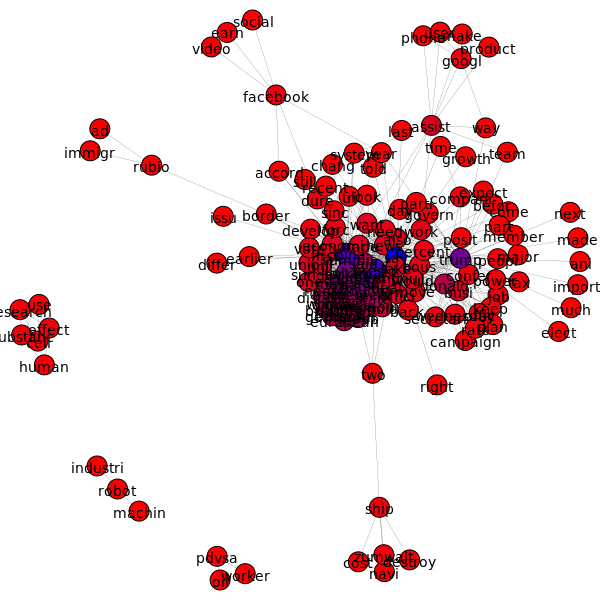

In [58]:
# dailymail
# dpal = ig.GradientPalette("red", "blue", max(dG_b.degree()) + 1)
# dG_b.vs['color'] = [dpal.get(v) for v in dG_b.degree()]
# plot = ig.plot(dG_b, 'myimage/dG_degree.png', layout = dlayout, edge_width = 0.2)
Image(filename='myimage/dG_degree.png')

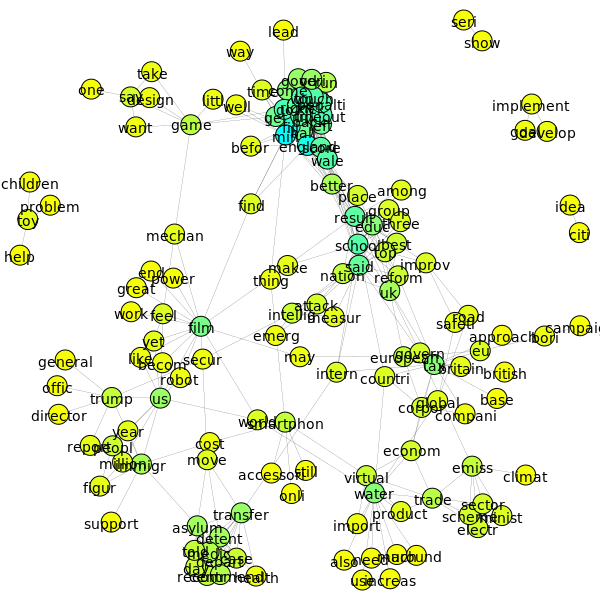

In [59]:
# guardian
# gpal = ig.GradientPalette("yellow", "cyan", max(gG_b.degree()) + 1)
# gG_b.vs['color'] = [gpal.get(v) for v in gG_b.degree()]
# plot = ig.plot(gG_b, 'myimage/gG_degree.png', layout = glayout, edge_width = 0.2)
Image(filename='myimage/gG_degree.png')

The top 10 words by degree are:

In [60]:
# dailymail
sorted(zip(dG_b.vs['name'], dG_b.degree()), key = lambda x: x[1], reverse = True)[:10]

[('say', 81),
 ('china', 65),
 ('presid', 55),
 ('summit', 49),
 ('obama', 45),
 ('meet', 40),
 ('turkey', 40),
 ('trump', 38),
 ('chines', 35),
 ('xi', 35)]

In [61]:
# guardian
sorted(zip(gG_b.vs['name'], gG_b.degree()), key = lambda x: x[1], reverse = True)[:10]

[('england', 24),
 ('fiji', 24),
 ('min', 24),
 ('lineout', 20),
 ('touch', 19),
 ('win', 19),
 ('go', 18),
 ('kick', 17),
 ('penalti', 17),
 ('school', 17)]

And the bottom 10:

In [62]:
# dailymail
sorted(zip(dG_b.vs['name'], dG_b.degree()), key = lambda x: x[1], reverse = False)[:10]

[('accord', 1),
 ('ad', 1),
 ('border', 1),
 ('compani', 1),
 ('cost', 1),
 ('earlier', 1),
 ('earn', 1),
 ('expect', 1),
 ('human', 1),
 ('immigr', 1)]

In [63]:
# guardian
sorted(zip(gG_b.vs['name'], gG_b.degree()), key = lambda x: x[1], reverse = False)[:10]

[('accessori', 1),
 ('approach', 1),
 ('around', 1),
 ('becom', 1),
 ('bori', 1),
 ('children', 1),
 ('design', 1),
 ('european', 1),
 ('general', 1),
 ('global', 1)]

The distrubtioon of degree looks like

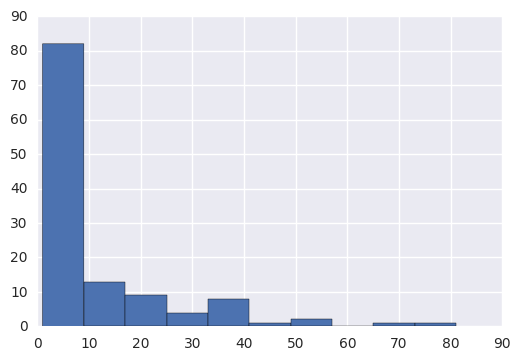

In [64]:
# dailymail
plt.hist(dG_b.degree())
plt.show()

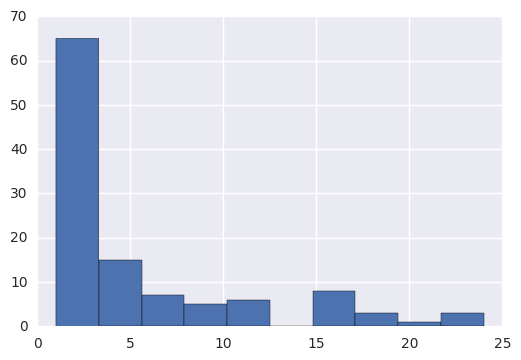

In [65]:
# guardian
plt.hist(gG_b.degree())
plt.show()

**Closeness centrality**

In [66]:
dG_b.vs[np.argmax(dG_b.closeness())]
gG_b.vs[np.argmax(gG_b.closeness())]

igraph.Vertex(<igraph.Graph object at 0x7feec887cc78>, 84, {'name': 'school', 'label': 'school'})

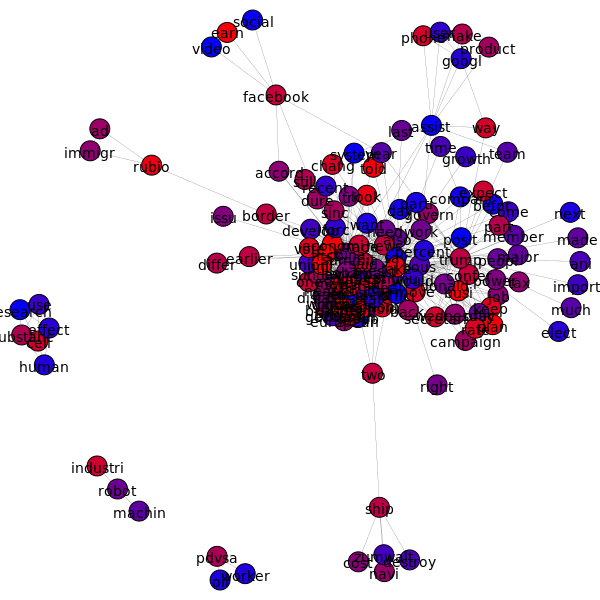

In [67]:
# dailymail
# dpal = ig.GradientPalette("red", "blue", dG_b.vcount())
# dG_b.vs['color'] = [dpal.get(int(v)) for v in np.argsort(dG_b.closeness())]
# plot = ig.plot(dG_b, 'myimage/dG_close.png', layout = dlayout, edge_width = 0.2)
Image(filename='myimage/dG_close.png')

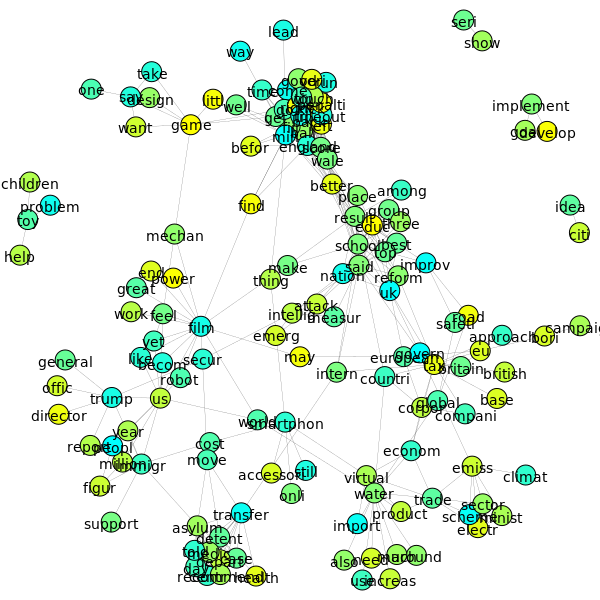

In [68]:
# guardian
# gpal = ig.GradientPalette("yellow", "cyan", gG_b.vcount())
# gG_b.vs['color'] = [gpal.get(int(v)) for v in np.argsort(gG_b.closeness())]
# plot = ig.plot(gG_b, 'myimage/gG_close.png', layout = glayout, edge_width = 0.2)
Image(filename='myimage/gG_close.png')

Top 10 words

In [69]:
# dailymail
sorted(zip(dG_b.vs['name'], dG_b.closeness()), key = lambda x: x[1], reverse = True)[:10]

[('say', 0.045061960195268494),
 ('china', 0.0446927374301676),
 ('presid', 0.044626255113425065),
 ('summit', 0.044427989633469084),
 ('obama', 0.04436229205175601),
 ('meet', 0.04428044280442804),
 ('countri', 0.044182621502209134),
 ('turkey', 0.044182621502209134),
 ('leader', 0.04416635995583364),
 ('trump', 0.04415011037527594)]

In [70]:
# guardian
sorted(zip(gG_b.vs['name'], gG_b.closeness()), key = lambda x: x[1], reverse = True)[:10]

[('school', 0.03748326639892905),
 ('result', 0.0374331550802139),
 ('england', 0.0373707040373707),
 ('reform', 0.037122969837587005),
 ('score', 0.037061548643282594),
 ('wale', 0.037024793388429754),
 ('better', 0.036939313984168866),
 ('educ', 0.03684210526315789),
 ('fiji', 0.036805783766020374),
 ('min', 0.036805783766020374)]

Bottom 10 words

In [71]:
# dailymail
sorted(zip(dG_b.vs['name'], dG_b.closeness()), key = lambda x: x[1], reverse = False)[:10]

[('ad', 0.00840277291506197),
 ('immigr', 0.00840277291506197),
 ('oil', 0.008403361344537815),
 ('pdvsa', 0.008403361344537815),
 ('rubio', 0.008403361344537815),
 ('worker', 0.008403361344537815),
 ('earn', 0.008473379466177093),
 ('social', 0.008473379466177093),
 ('video', 0.008473379466177093),
 ('facebook', 0.00847457627118644)]

In [72]:
# guardian
sorted(zip(gG_b.vs['name'], gG_b.closeness()), key = lambda x: x[1], reverse = False)[:10]

[('children', 0.008928571428571428),
 ('goal', 0.008928571428571428),
 ('implement', 0.008928571428571428),
 ('toy', 0.008928571428571428),
 ('figur', 0.009090171252333414),
 ('million', 0.009090171252333414),
 ('immigr', 0.00909090909090909),
 ('peopl', 0.00909090909090909),
 ('design', 0.009172057980509378),
 ('say', 0.009172057980509378)]

**Eignvector centrality**

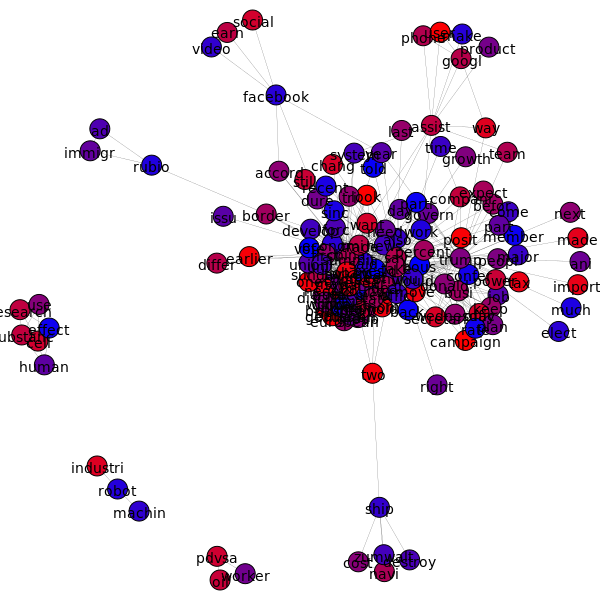

In [73]:
# dailymail
# dG_b.vs['color'] = [dpal.get(int(v)) for v in np.argsort(dG_b.eigenvector_centrality())]
# plot = ig.plot(dG_b, 'myimage/dG_eigvec.png', layout = dlayout, edge_width = 0.2)
Image(filename='myimage/dG_eigvec.png')

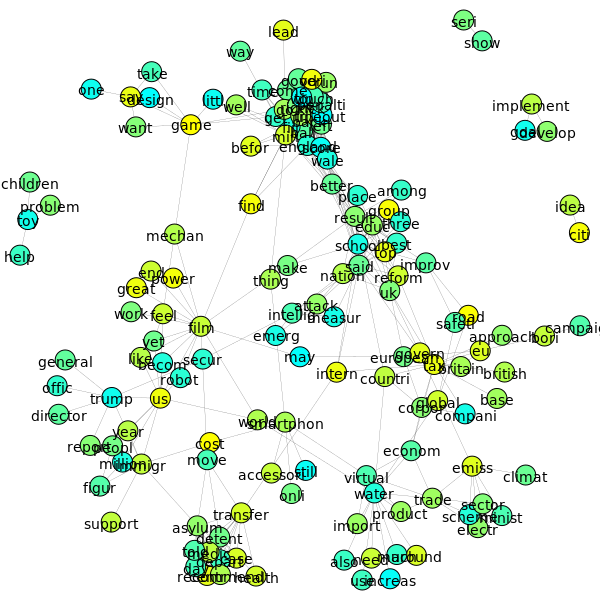

In [74]:
# guardian
# gG_b.vs['color'] = [gpal.get(int(v)) for v in np.argsort(gG_b.eigenvector_centrality())]
# plot = ig.plot(gG_b, 'myimage/gG_eigvec.png', layout = glayout, edge_width = 0.2)
Image(filename='myimage/gG_eigvec.png')

Top 10 words:

In [75]:
# dailymail
sorted(zip(dG_b.vs['name'], dG_b.eigenvector_centrality()), key = lambda x: x[1], reverse = True)[:10]

[('say', 0.9999999999999999),
 ('china', 0.957854151264918),
 ('presid', 0.947378198016568),
 ('summit', 0.9186503118783106),
 ('obama', 0.9013741831454584),
 ('meet', 0.8697601607546677),
 ('turkey', 0.8667906836912928),
 ('chines', 0.8271063620681512),
 ('xi', 0.8271063620681509),
 ('countri', 0.8138820814395861)]

In [76]:
# guardian
sorted(zip(gG_b.vs['name'], gG_b.eigenvector_centrality()), key = lambda x: x[1], reverse = True)[:10]

[('england', 1.0),
 ('fiji', 0.9920770872055925),
 ('min', 0.9920770872055915),
 ('lineout', 0.9538633142935455),
 ('win', 0.939298271768269),
 ('touch', 0.9392982717682687),
 ('go', 0.9177851040447377),
 ('penalti', 0.8928774417289848),
 ('kick', 0.8928774417289842),
 ('back', 0.8571558385490989)]

Bottom 10 words:

In [77]:
# dailymail
sorted(zip(dG_b.vs['name'], dG_b.eigenvector_centrality()), key = lambda x: x[1], reverse = False)[:10]

[('ad', 0.0),
 ('cell', -0.0),
 ('cost', -0.0),
 ('destroy', 0.0),
 ('earn', 0.0),
 ('effect', 0.0),
 ('facebook', 0.0),
 ('human', 0.0),
 ('immigr', 0.0),
 ('navi', 0.0)]

In [78]:
# guardian
sorted(zip(gG_b.vs['name'], gG_b.eigenvector_centrality()), key = lambda x: x[1], reverse = False)[:10]

[('asylum', -0.0),
 ('case', -0.0),
 ('children', 0.0),
 ('day', 0.0),
 ('design', 0.0),
 ('detent', -0.0),
 ('figur', 0.0),
 ('game', 0.0),
 ('goal', 0.0),
 ('implement', 0.0)]

We can also look at global statistics, like the density of a network, defined as the number of edges existing divided by the total number of edges possible:

In [79]:
print('Density of Daily Mail corpus:', dG_b.density())
print('Density of The Guardian corpus:', gG_b.density())

Density of Daily Mail corpus: 0.08870523415977961
Density of The Guardian corpus: 0.048514538558786346


We can also calculate the average degree per node:

In [80]:
print('The average degree per node for Daily Mail corpus:', np.mean(dG_b.degree()))
print('The average degree per node for The Guardian corpus:', np.mean(gG_b.degree()))

The average degree per node for Daily Mail corpus: 10.6446280992
The average degree per node for The Guardian corpus: 5.43362831858


The diameter calculates the average distance between any two nodes in the network:

In [81]:
print('The diameter of Daily Mail corpus:', dG_b.diameter())
print('The diameter of The Guardian corpus:', gG_b.diameter())

The diameter of Daily Mail corpus: 5
The diameter of The Guardian corpus: 13


Moreover, we can find cliques, or completely connected sets of nodes:

In [82]:
print('Cliques in Daily Mail corpus:', dG_b.largest_cliques())
print('Cliques in The Guardian corpus:', gG_b.largest_cliques())

Cliques in Daily Mail corpus: [(86, 13, 78, 93, 64, 103, 56, 14, 118, 95, 19, 49, 2, 8, 55, 6, 9, 58, 84, 50, 116), (86, 13, 78, 93, 64, 103, 56, 14, 118, 95, 19, 49, 2, 8, 55, 6, 9, 58, 84, 38, 116), (86, 13, 78, 93, 64, 103, 56, 14, 118, 95, 19, 49, 2, 8, 55, 6, 9, 58, 84, 38, 79), (86, 13, 78, 93, 64, 103, 56, 14, 118, 95, 19, 49, 2, 8, 55, 6, 9, 58, 84, 38, 32)]
Cliques in The Guardian corpus: [(29, 34, 63, 57, 95, 109, 41, 54, 69, 6, 99, 76, 85), (29, 34, 63, 57, 95, 109, 41, 54, 69, 6, 99, 76, 55), (29, 34, 63, 57, 95, 109, 41, 54, 69, 6, 99, 76, 39), (29, 34, 63, 57, 95, 109, 41, 54, 69, 6, 99, 76, 7)]


In [83]:
print('Words in the first clique in Daily Mail corpus:', ', '.join((dG_b.vs[i]['name'] for i in dG_b.largest_cliques()[0])))
print('Words in the first clique in The Guardian corpus:', ', '.join((gG_b.vs[i]['name'] for i in gG_b.largest_cliques()[0])))

Words in the first clique in Daily Mail corpus: say, china, presid, summit, obama, turkey, meet, chines, xi, syria, countri, leader, agreement, britain, may, barack, british, minist, russian, leav, world
Words in the first clique in The Guardian corpus: england, fiji, min, lineout, touch, win, go, kick, penalti, back, tri, right, score


Now lets look at a subgraph of the network, those nodes that are within 2 edges 'trump'.

In [84]:
# dailymail
dtrumpNeighbors = dG_b.neighbors('trump')
dtrumpNeighborsPlus1 = set(dtrumpNeighbors)
for n in dtrumpNeighbors:
    dtrumpNeighborsPlus1 |= set(dG_b.neighbors(n))

# guardian    
gtrumpNeighbors = gG_b.neighbors('trump')
gtrumpNeighborsPlus1 = set(gtrumpNeighbors)
for n in gtrumpNeighbors:
    gtrumpNeighborsPlus1 |= set(gG_b.neighbors(n))

In [85]:
# dailymail
dG_t = dG_b.subgraph(dG_b.vs.select(dtrumpNeighborsPlus1))
print(dG_t.vcount())

# guardian
gG_t = gG_b.subgraph(gG_b.vs.select(gtrumpNeighborsPlus1))
print(gG_t.vcount())

88
9


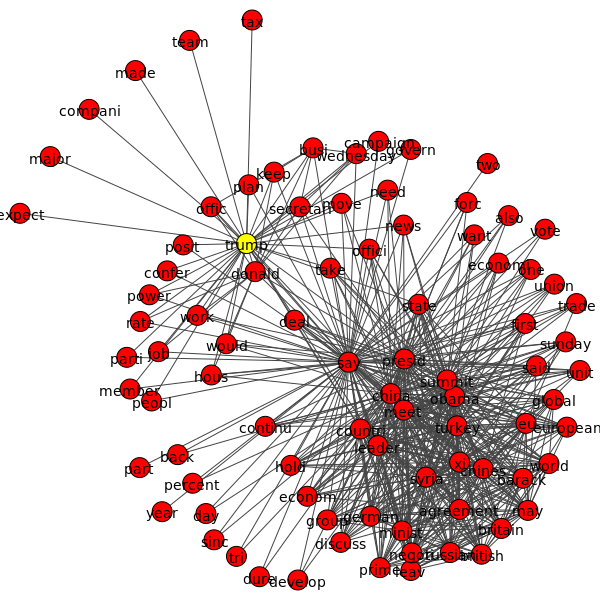

In [86]:
# dailymail
# dG_t.vs['color'] = 'red'
# dG_t.vs.find('trump')['color'] = 'yellow'
# plot = ig.plot(dG_t, target = 'myimage/dG_trump.png')
Image(filename='myimage/dG_trump.png')

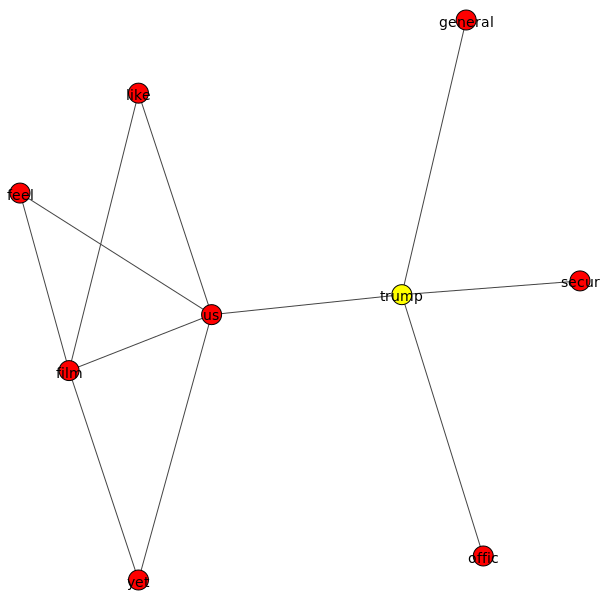

In [87]:
# guardian
# gG_t.vs['color'] = 'red'
# gG_t.vs.find('trump')['color'] = 'yellow'
# plot = ig.plot(gG_t, target = 'myimage/gG_trump.png')
Image(filename='myimage/gG_trump.png')

## <span style="color:red">*My Memo*</span>

<span style="color:red">**Betweenness**: For Daily Mail corpus, top scoring words include say, trump, china, presid. For Guardian, top scoring words include film, water, school, min, and tax.  
**Degree centrality**: For Daily Mail, top scoring words include say, china, presid, summit and obama. For Guardian, top scoring words include min, england, fiji, go and lineout.  
**Closeness**: For Daily Mail, top scoring words include say, presid, china, summit and meet. For Guardian, top scoring words include school, film, result, england and said.  
**Eigenvector centrality**: For Daily Mail, top scoring words include say, presid, china, summit and meet. For Guardian, top scoring words include min, england, fiji, lineout and win.  

<span style="color:red">In case of Daily Mail corpus, high-scoring words in one measure of centrality tend to score high in other measures, too. Words in The Guardian corpus also show a similar result but to a less extent. This is somewhat expected because the word network for Daily Mail corpus has a highly centralized pattern while the word network for The Guardian is rather decentralized.

<span style="color:red">Finally, the last couple plots compare two word networks with 'trump'. The trump network for Daily Mail is much larger and more elaborate than its counterpart for The Guardian. This confirms the observation I made in the previous section.

# POS based networks

## <span style="color:red">*Your Turn*</span>

<span style="color:red">Construct cells immediately below this that construct at least two different networks comprising different combinations of word types, linked by different syntactic structures, that illuminate your corpus and the dynamics you are interested to explore. Graph these networks or subnetworks within them. What are relationships that are meaningful?

In [88]:
def posCooccurrence(sentences, *posType, makeMatrix = False):
    pal = ig.RainbowPalette(n = len(posType))
    palMap = {p : pal.get(i) for i, p in enumerate(posType)}
    words = set()
    reducedSents = []
    #Only using the first kind of POS for each word
    wordsMap = {}
    for sent in sentences:
        s = [(w, t) for w, t in nltk.pos_tag(sent) if t in posType]
        for w, t in s:
            if w not in wordsMap:
                wordsMap[w] = t
        reducedSent = [w for w, t in s]
        words |= set(reducedSent)
        reducedSents.append(reducedSent)
    wordLst = list(words)
    wordIndices = {w: i for i, w in enumerate(wordLst)}
    wordCoCounts = {}
    #consider a sparse matrix if memory becomes an issue
    coOcMat = np.zeros((len(wordIndices), len(wordIndices)))
    for sent in reducedSents:
        for i, word1 in enumerate(sent):
            word1Index = wordIndices[word1]
            for word2 in sent[i + 1:]:
                coOcMat[word1Index][wordIndices[word2]] += 1
    if makeMatrix:
        return coOcMat, wordLst
    else:
        coOcMat = coOcMat.T + coOcMat
        edges = list(zip(*np.where(coOcMat)))
        weights = coOcMat[np.where(coOcMat)]
        kinds = [wordsMap[w] for w in wordLst]
        colours = [palMap[k] for k in kinds]
        g = ig.Graph( n = len(wordLst),
            edges = edges,
            vertex_attrs = {'name' : wordLst, 
                            'label' : wordLst, 
                            'kind' : kinds,
                            'color' : colours,
                           },
            edge_attrs = {'weight' : weights})
        return g

In [89]:
dgNN = posCooccurrence(dailymailDF['normalized_sents'].sum(), 'NN')
ggNN = posCooccurrence(guardianDF['normalized_sents'].sum(), 'NN')

In [90]:
print(dgNN.vcount())
print(ggNN.vcount())

1933
2783


Remove the verices whose degree is less than or equal to 100:

In [91]:
dgNN_d = dgNN.subgraph(dgNN.vs.select(lambda x: x.degree() > 100))
ggNN_d = ggNN.subgraph(ggNN.vs.select(lambda x: x.degree() > 100))
print(dgNN_d.vcount())
print(ggNN_d.vcount())

188
335


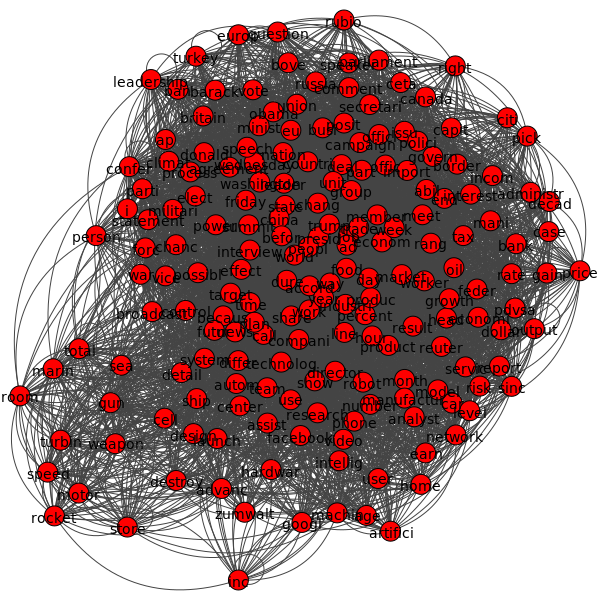

In [92]:
# dailymail
# plot = ig.plot(dgNN_d, target = 'myimage/dgNN_d.png')
Image('myimage/dgNN_d.png')

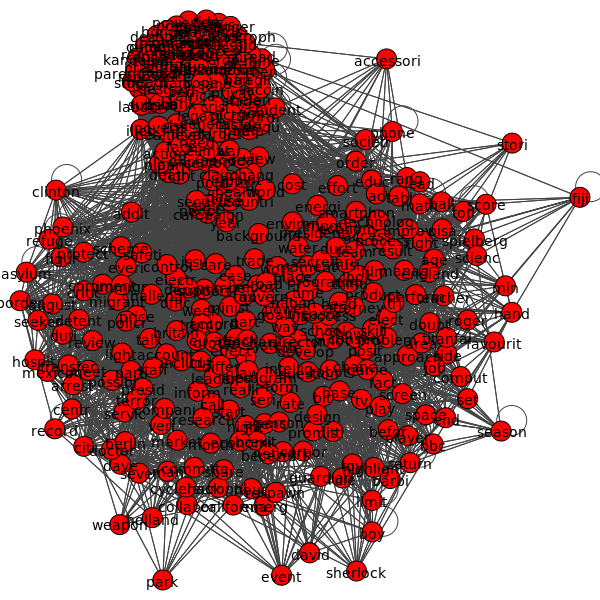

In [93]:
# guardian
# plot = ig.plot(ggNN_d, target = 'myimage/ggNN_d.png')
Image('myimage/ggNN_d.png')

This is still a hairball because we retained the most highly connected veritices. Let's trim a few edges as well.

In [97]:
# trimming
dgNN_d_trimmed = dgNN_d.subgraph_edges(dgNN_d.es.select(lambda x: x['weight'] > 4))
ggNN_d_trimmed = ggNN_d.subgraph_edges(ggNN_d.es.select(lambda x: x['weight'] > 4))
print(dgNN_d_trimmed.ecount())
print(ggNN_d_trimmed.ecount())

167
338


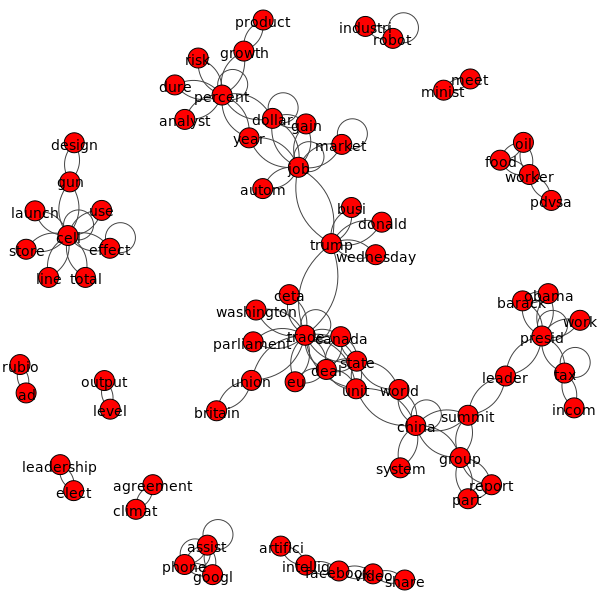

In [98]:
# dailymail
plot = ig.plot(dgNN_d_trimmed, target ='myimage/dgNN_d2.png')
Image('myimage/dgNN_d2.png')

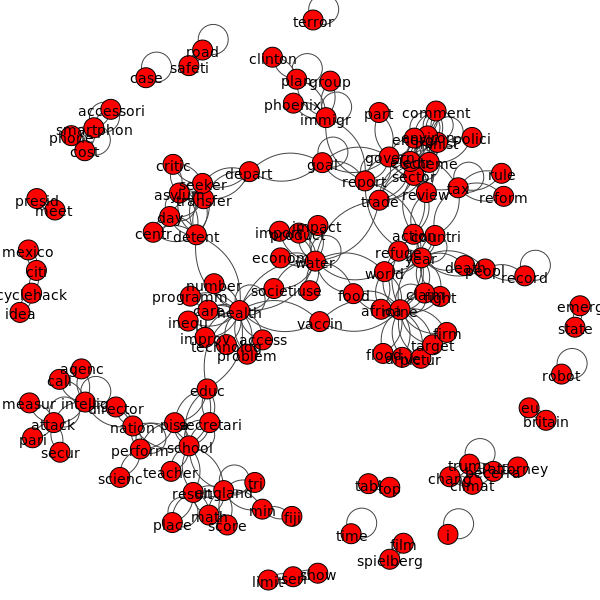

In [99]:
# guardian
plot = ig.plot(ggNN_d_trimmed, target ='myimage/ggNN_d2.png')
Image('myimage/ggNN_d2.png')

In [100]:
# dailymail
for e in dgNN_d.es.select(lambda x: x.is_loop()):
    print(dgNN_d.vs[e.source])

# guardian
for e in ggNN_d.es.select(lambda x: x.is_loop()):
    print(ggNN_d.vs[e.source])

igraph.Vertex(<igraph.Graph object at 0x7feec08ee048>, 2, {'color': (1.0, 0.0, 0.0, 1.0), 'name': 'trade', 'kind': 'NN', 'label': 'trade'})
igraph.Vertex(<igraph.Graph object at 0x7feec08ee048>, 4, {'color': (1.0, 0.0, 0.0, 1.0), 'name': 'elect', 'kind': 'NN', 'label': 'elect'})
igraph.Vertex(<igraph.Graph object at 0x7feec08ee048>, 8, {'color': (1.0, 0.0, 0.0, 1.0), 'name': 'store', 'kind': 'NN', 'label': 'store'})
igraph.Vertex(<igraph.Graph object at 0x7feec08ee048>, 22, {'color': (1.0, 0.0, 0.0, 1.0), 'name': 'level', 'kind': 'NN', 'label': 'level'})
igraph.Vertex(<igraph.Graph object at 0x7feec08ee048>, 23, {'color': (1.0, 0.0, 0.0, 1.0), 'name': 'turkey', 'kind': 'NN', 'label': 'turkey'})
igraph.Vertex(<igraph.Graph object at 0x7feec08ee048>, 24, {'color': (1.0, 0.0, 0.0, 1.0), 'name': 'campaign', 'kind': 'NN', 'label': 'campaign'})
igraph.Vertex(<igraph.Graph object at 0x7feec08ee048>, 25, {'color': (1.0, 0.0, 0.0, 1.0), 'name': 'launch', 'kind': 'NN', 'label': 'launch'})
igraph

What if we want to look at noun-verb pairs instead?

In [101]:
# dailymail
dgNV = posCooccurrence(dailymailDF['normalized_sents'].sum(), 'NN', 'VB')
# guardian
ggNV = posCooccurrence(guardianDF['normalized_sents'].sum(), 'NN', 'VB')

`dgNV`and `ggNV` have co-occurrences between nouns and nouns as well as between verbs and verbs. Let's remove these and make it purely about noun and verb combinations:

In [121]:
dgNV_p = dgNV.subgraph_edges(dgNV.es.select(lambda x: dgNV.vs[x.source]['kind'] != dgNV.vs[x.target]['kind']))
ggNV_p = ggNV.subgraph_edges(ggNV.es.select(lambda x: ggNV.vs[x.source]['kind'] != ggNV.vs[x.target]['kind']))

Dropping low weight edges and low degree vertices again gives us:

In [122]:
# dailymail
dgNV_p = dgNV_p.subgraph(dgNV_p.vs.select(lambda x: x.degree() > 30))
dgNV_p = dgNV_p.subgraph_edges(dgNV_p.es.select(lambda x: x['weight'] > 5))

In [123]:
# guardian
ggNV_p = ggNV_p.subgraph(ggNV_p.vs.select(lambda x: x.degree() > 30))
ggNV_p = ggNV_p.subgraph_edges(ggNV_p.es.select(lambda x: x['weight'] > 5))

In [124]:
print(dgNV_p.vcount())
print(ggNV_p.vcount())

26
49


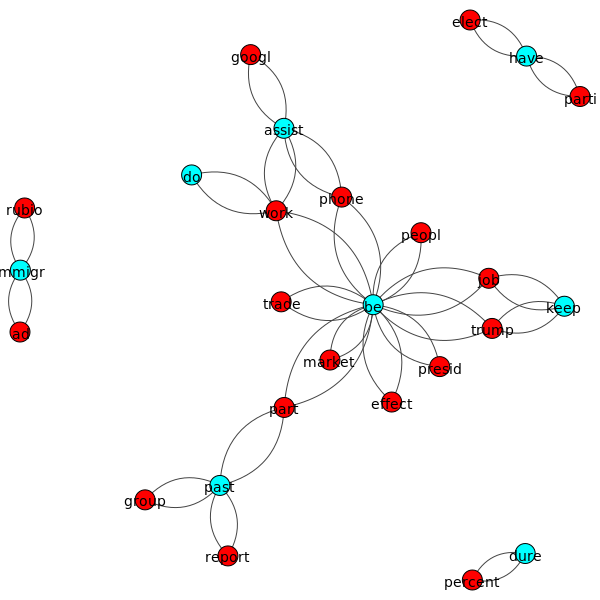

In [125]:
# dailymail
# dlayoutNV = dgNV_p.layout_fruchterman_reingold()
# plot = ig.plot(dgNV_p, layout = dlayoutNV, target = 'myimage/dgNV_p.png')
Image('myimage/dgNV_p.png')

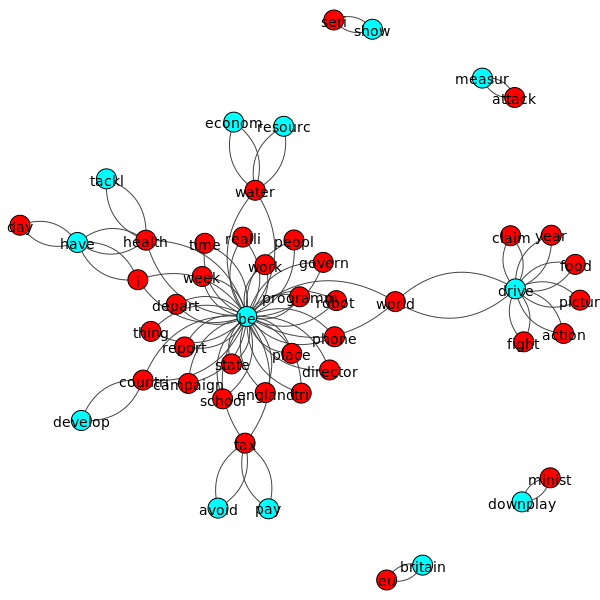

In [126]:
# guardian 
# glayoutNV = ggNV_p.layout_fruchterman_reingold()
# plot = ig.plot(ggNV_p, layout = glayoutNV, target = 'myimage/ggNV_p.png')
Image('myimage/ggNV_p.png')

Looking at this plot it looks like `be` is the centers of two communities. Lets check this by partitioning the networks, a graphical method of clustering. Our first approach will use the information theoretic infomap algorithm:

In [127]:
print(dgNV_p.community_infomap(edge_weights = dgNV_p.es['weight']))
print(ggNV_p.community_infomap(edge_weights = ggNV_p.es['weight']))

Clustering with 26 elements and 7 clusters
[0] trade, effect, do, part, be, presid, market, work, peopl
[1] past, group, report
[2] rubio, immigr, ad
[3] elect, have, parti
[4] assist, phone, googl
[5] trump, keep, job
[6] percent, dure
Clustering with 49 elements and 11 clusters
[ 0] govern, director, robot, be, depart, realli, report, work, time, england,
     campaign, place, phone, programm, school, world, tri, state, week, peopl,
     thing
[ 1] pictur, action, drive, fight, food, year, claim
[ 2] i, have, day
[ 3] avoid, pay, tax
[ 4] water, resourc, econom
[ 5] tackl, health
[ 6] minist, downplay
[ 7] show, seri
[ 8] measur, attack
[ 9] britain, eu
[10] countri, develop



Let's focus on one of these communities and create an "trump network" surrounding a single (important) word

In [128]:
# dailymail
dgNV_trump = dgNV.subgraph(dgNV.vs.find('trump').neighbors())
#Still need to filter it a bit to display
print(dgNV_trump.vcount())

# guardian
ggNV_trump = ggNV.subgraph(ggNV.vs.find('trump').neighbors())
#Still need to filter it a bit to display
print(ggNV_trump.vcount())

322
204


In [129]:
# dailymail
dgNV_trump = dgNV_trump.subgraph(dgNV_trump.vs.select(lambda x: x.degree() > 30))
dgNV_trump = dgNV_trump.subgraph_edges(dgNV_trump.es.select(lambda x: x['weight'] > 5))

# guardian
ggNV_trump = ggNV_trump.subgraph(ggNV_trump.vs.select(lambda x: x.degree() > 30))
ggNV_trump = ggNV_trump.subgraph_edges(ggNV_trump.es.select(lambda x: x['weight'] > 5))

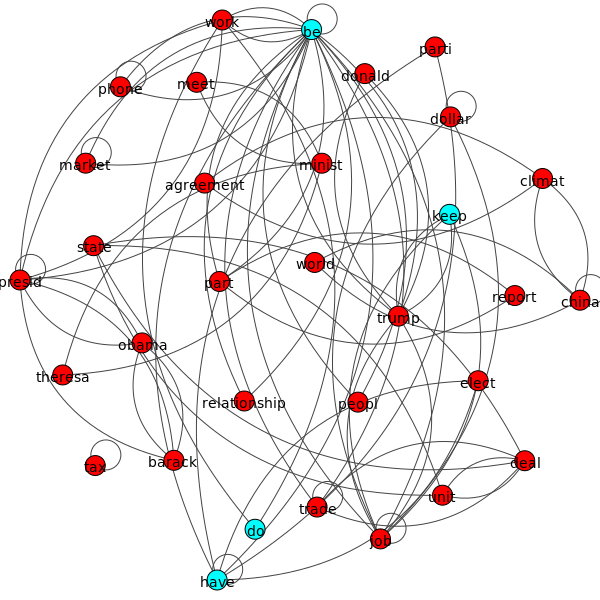

In [130]:
# dailymail
# dlayoutNV_trump = dgNV_trump.layout_fruchterman_reingold(repulserad = .001)
# plot = ig.plot(dgNV_trump, layout = dlayoutNV_trump, target = 'myimage/dgNV_trump.png')
IPython.display.Image('myimage/dgNV_trump.png')

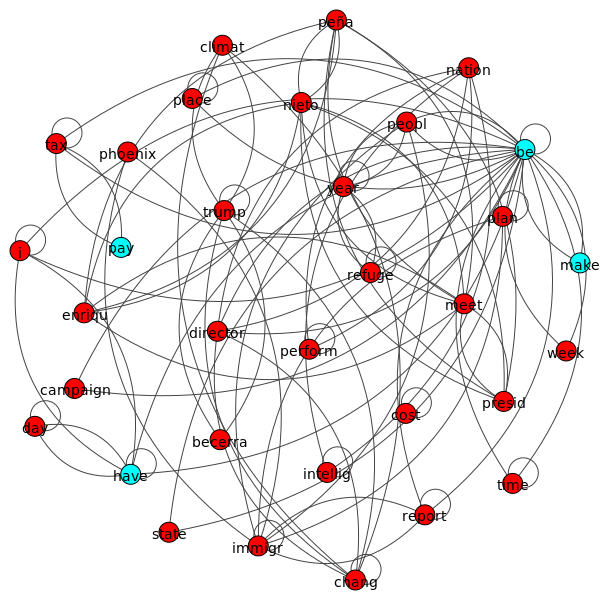

In [131]:
# guardian
# glayoutNV_trump = ggNV_trump.layout_fruchterman_reingold(repulserad = .001)
# plot = ig.plot(ggNV_trump, layout = glayoutNV_trump, target = 'myimage/ggNV_trump.png')
IPython.display.Image('myimage/ggNV_trump.png')

Instead of just those connect to a vertex we can find all those connected to it within 2 hops, lets look at **'brexit'** for this

In [132]:
dgNV.vs.find('brexit')

igraph.Vertex(<igraph.Graph object at 0x7feec08ee7c8>, 1621, {'color': (1.0, 0.0, 0.0, 1.0), 'name': 'brexit', 'kind': 'NN', 'label': 'brexit'})

In [133]:
ggNV.vs.find('brexit')

igraph.Vertex(<igraph.Graph object at 0x7feec08ee6d8>, 1133, {'color': (1.0, 0.0, 0.0, 1.0), 'name': 'brexit', 'kind': 'NN', 'label': 'brexit'})

In [134]:
# dailymail
dstoryNeighbors = dgNV.neighbors('brexit')
dstoryNeighborsPlus1 = set(dstoryNeighbors)
for n in dstoryNeighbors:
    dstoryNeighborsPlus1 |= set(dgNV.neighbors(n))

# guardian
gstoryNeighbors = ggNV.neighbors('brexit')
gstoryNeighborsPlus1 = set(gstoryNeighbors)
for n in gstoryNeighbors:
    gstoryNeighborsPlus1 |= set(ggNV.neighbors(n))

In [135]:
# dailymail
dgNV_brexit = dgNV.subgraph(dgNV.vs.select(dstoryNeighborsPlus1))
print(dgNV_brexit.vcount())

# guardian
ggNV_brexit = ggNV.subgraph(ggNV.vs.select(gstoryNeighborsPlus1))
print(ggNV_brexit.vcount())

1398
1807


A large network, but we can compute some statistics:

In [136]:
sorted(zip(dgNV_brexit.vs['name'], dgNV_brexit.degree()), key = lambda x: x[1], reverse = True)[:10]

[('be', 1116),
 ('trump', 644),
 ('trade', 640),
 ('year', 618),
 ('peopl', 504),
 ('ad', 474),
 ('work', 442),
 ('job', 426),
 ('deal', 424),
 ('presid', 410)]

In [137]:
sorted(zip(ggNV_brexit.vs['name'], ggNV_brexit.degree()), key = lambda x: x[1], reverse = True)[:10]

[('be', 1320),
 ('world', 774),
 ('year', 742),
 ('use', 688),
 ('have', 678),
 ('countri', 666),
 ('peopl', 642),
 ('state', 570),
 ('help', 568),
 ('campaign', 566)]

Or by eignvector centrality:

In [138]:
sorted(zip(dgNV_brexit.vs['name'], dgNV_brexit.eigenvector_centrality()), key = lambda x: x[1], reverse = True)[:10]

[('be', 1.0),
 ('year', 0.6875685900417873),
 ('trump', 0.6856290620650911),
 ('trade', 0.6464440743406462),
 ('peopl', 0.5856932312549623),
 ('work', 0.5440245744760795),
 ('presid', 0.5199196469883782),
 ('job', 0.5170548458006486),
 ('world', 0.5054949165562626),
 ('deal', 0.4948469336962482)]

In [139]:
sorted(zip(ggNV_brexit.vs['name'], ggNV_brexit.eigenvector_centrality()), key = lambda x: x[1], reverse = True)[:10]

[('year', 0.9999999999999999),
 ('countri', 0.9788736982395542),
 ('world', 0.9778557113177325),
 ('use', 0.9665792763291627),
 ('peopl', 0.9532904927534821),
 ('secur', 0.9516682647289055),
 ('state', 0.9354850648956863),
 ('chang', 0.9285463278990986),
 ('campaign', 0.9263271100677636),
 ('day', 0.9238828953795243)]

Notice that 'brexit' isn't even in the top 10 for either corpus.

Lets filter it a bit than plot

In [140]:
# dailymail
dgNV_brexit_filtered = dgNV_brexit.subgraph(dgNV_brexit.vs.select(lambda x: x.degree() > 400 or x['name'] == 'brexit'))
dgNV_brexit_filtered = dgNV_brexit_filtered.subgraph_edges(dgNV_brexit_filtered.es.select(lambda x: x['weight'] > 1.9))
dgNV_brexit_filtered.vs.find('brexit')['color'] = 'yellow'

# guardian
ggNV_brexit_filtered = ggNV_brexit.subgraph(ggNV_brexit.vs.select(lambda x: x.degree() > 400 or x['name'] == 'brexit'))
ggNV_brexit_filtered = ggNV_brexit_filtered.subgraph_edges(ggNV_brexit_filtered.es.select(lambda x: x['weight'] > 1.9))
ggNV_brexit_filtered.vs.find('brexit')['color'] = 'yellow'

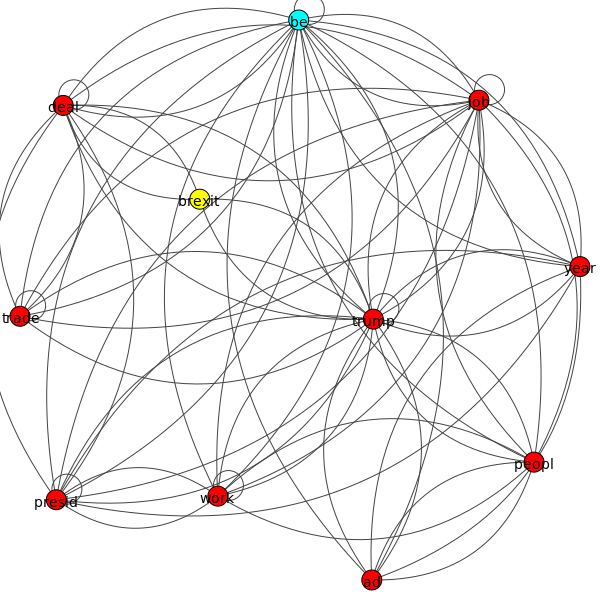

In [141]:
# dailymail
# dlayoutNV_brexit_filtered = dgNV_brexit_filtered.layout_fruchterman_reingold(repulserad = .001)
# plot = ig.plot(dgNV_brexit_filtered, layout = dlayoutNV_brexit_filtered, target = 'myimage/dgNV_brexit.png')
Image('myimage/dgNV_brexit.png')

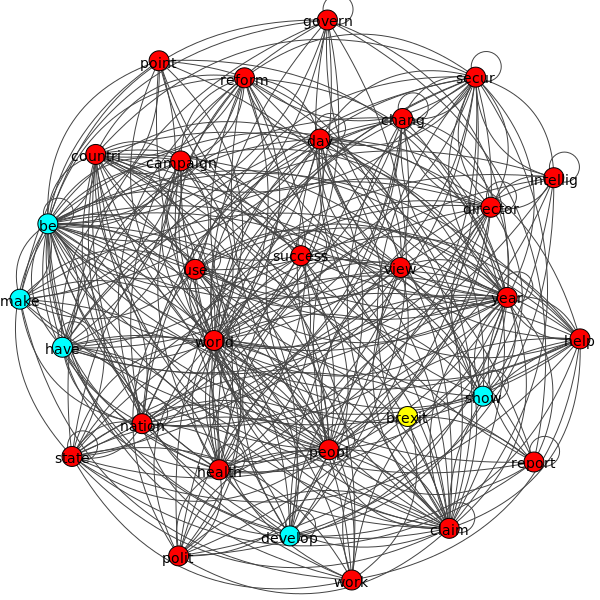

In [142]:
# guardian
# glayoutNV_brexit_filtered = ggNV_brexit_filtered.layout_fruchterman_reingold(repulserad = .001)
# plot = ig.plot(ggNV_brexit_filtered, layout = glayoutNV_brexit_filtered, target = 'myimage/ggNV_brexit.png')
Image('myimage/ggNV_brexit.png')

Be is still present in both networks as a key element

Now, I'm curious to see what adjectives are close to 'trump' in each corpus 

In [143]:
# dailymail
dgNJ = posCooccurrence(dailymailDF['normalized_sents'].sum(), 'NN', 'JJ')
dgNJ_trump = dgNJ.subgraph_edges(dgNJ.es.select(lambda x: dgNJ.vs[x.source]['kind'] != dgNJ.vs[x.target]['kind']))
dgNJ_trump = dgNJ_trump.subgraph(dgNJ_trump.vs.select(lambda x: x.degree() > 95))
dgNJ_trump = dgNJ_trump.subgraph_edges(dgNJ_trump.es.select(lambda x: x['weight'] > 4))
dgNJ_trump.vs.find('trump')['color'] = 'yellow'

# guardian
ggNJ = posCooccurrence(guardianDF['normalized_sents'].sum(), 'NN', 'JJ')
ggNJ_trump = ggNJ.subgraph_edges(ggNJ.es.select(lambda x: ggNJ.vs[x.source]['kind'] != ggNJ.vs[x.target]['kind']))
ggNJ_trump = ggNJ_trump.subgraph(ggNJ_trump.vs.select(lambda x: x.degree() > 95))
ggNJ_trump = ggNJ_trump.subgraph_edges(ggNJ_trump.es.select(lambda x: x['weight'] > 4))
ggNJ_trump.vs.find('trump')['color'] = 'yellow'


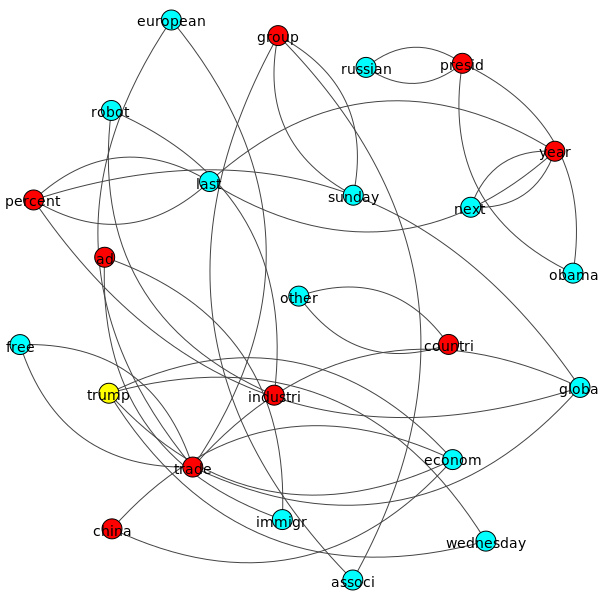

In [144]:
# dailymail
# dlayoutNJ_trump = dgNJ_trump.layout_fruchterman_reingold(repulserad = .001)
# plot = ig.plot(dgNJ_trump, layout = dlayoutNJ_trump, target = 'myimage/dgNJ_trump.png')
Image('myimage/dgNJ_trump.png')

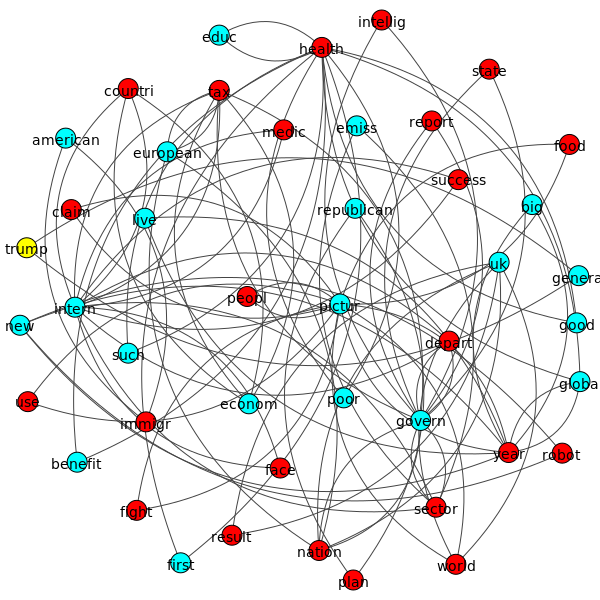

In [145]:
# guardian
# glayoutNJ_trump = ggNJ_trump.layout_fruchterman_reingold(repulserad = .001)
# plot = ig.plot(ggNJ_trump, layout = glayoutNJ_trump, target = 'myimage/ggNJ_trump.png')
Image('myimage/ggNJ_trump.png')

## <span style="color:red">*My Memo*</span>

<span style="color:red">Some findings from the POS network graphs are the following:  
<span style="color:red"> - In the noun-verb pair networks for both corpora, the verb 'be' seems to be the most central word.  
<span style="color:red"> - When allowing for the second hops, the Daily Mail noun-verb pair network shows that 'brexit' is connected to 'deal' and, interestingly, 'trump'. That is, in some way, 'brexit' and 'trump' are close to each other in the Daily Mail articles. It is not the case in the Guardian corpus.  
<span style="color:red"> - The noun-adjective network with word 'trump' for The Guardian has a greater variety of words than its counterpart for Daily Mail. Adjectives are in cyan color.  
<span style="color:red"> - The noun-adjective network with word 'trump' for Daily Mail shows that 'russian' is close to the word 'trump' while its counterpart for The Guardian shows that 'republican' is close to 'trump'.  